In [3]:
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.helpers import launch_env, wrap_env, view_results_ipython
from simulation.gym_duckietown.wrappers import SteeringToWheelVelWrapper
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Control

In robotics, control is often considered a discipline in its own right. Simply, control theory allows us to map from sensory data (or, some sort of intermediate representation) to actuation commands - these commands can help drive our Duckiebot, fly our planes, and even land our rockets.

For those coming from a machine learning background (or those with familiarity with reinforcement learning and imitation learning), you may have noticed a difference between the control covered in class and the controllers, or *policies*, that you may normally train. In robotics, an important part of control is feedback; Feedback allows our controller to self-regulate and tune, and is an important part of the control process. 

In this exercise, we will cover two controllers: a simple, PD controller, and a slightly more complicated pure-pursuit controller in Part 2. 


## Part 1: PID

A PID controller, named for its components of **Proportional**, **Integral**, and **Derivative**, is a simple yet robust mechanism. This generality has lead to its widespread use across multiple disciplines, and is what our exercise will start with. More eloquently (from Wikipedia): *A PID controller continuously calculates an error value e(t) as the difference between a desired setpoint (SP) and a measured process variable (PV) and applies a correction based on proportional, integral, and derivative terms (denoted P, I, and D respectively), hence the name.*

*In practical terms it automatically applies accurate and responsive correction to a control function.*

In our exercise, we will only implement the **P**ropotional and (an approximation to the) **D**erivative control corrections.

Before we begin with the practical portion, the **first part of the exercise** consists of the following:

*Explain, qualitatively, the difference between the three terms. For the following types of controllers, explain the error terms involved in the correction, and what types of applications they are commonly used for. If these controllers do not exist (or cannot), explain why.*

1. P
2. PI
3. PD
4. ID
5. PID

Put your answers inside of the zip file, inside of a file named **03-control.txt**.

***

As we continue towards the practical portion of the first exercise, we will be tasked with setting up a controller that keeps the Duckiebot on the road. 

In the kinematics exercise, we saw how to translate linear and angular velocity commands into wheel rate. After understanding the conversion, we still need to answer a more important question: *what* commands should we use to control the Duckiebot?

Since we're using a simulation, we are able to access the ground-truth values of two variables that are crucial to help our Duckiebot stay in the lane: $d$, the distance to the center of the lane, and $\omega$, the angle with respect to the lane. 

In your file `notebooks/code/exercise_03_control/controller.py`, complete function `angle_control_commands`. Update `omega` (angular speed) to achieve your goal while keeping `v` constant.

In [2]:
from notebooks.code.exercise_03_control.controller import Controller

# Setting up the environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
total_reward = 0        
controller = Controller(angle_gain=6)
distances = []
angles = []

# Starting to drive
for _ in range(1000):
    # Getting the pose
    lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
    dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
    angle = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.
    
    # Control
    v = 0.5  # For now, keep linear velocity constant                                                
    omega = controller.angle_control_commands(dist, angle, pid_type='pd')
    commands = np.array([v, omega])
    
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    # Save variables to plot
    angles.append(angle)
    distances.append(dist)
    
    if d: 
        print("Duckiebot crashed.")
        break
        
        
local_env.close()
for attribute, value in controller.__dict__.items():
    print(attribute, '=', value)
print(total_reward)

06:16:27|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
06:16:27|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
06:16:27|gym-duckietown|simulator.py:535|_load_map(): loading map file "/duckietown/simulation/gym_duckietown/maps/loop_empty.yaml"
06:16:27|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckiebot.obj"
06:16:27|gym-duckietown|objmesh.py:238|_load_mtl(): loading materials from "/duckietown/simulation/gym_duckietown/meshes/duckiebot.mtl"
06:16:28|gym-duckietown|objmesh.py:50|__init__(): loading mesh "duckie.obj"
06:16:28|gym-duckietown|graphics.py:60|load_texture(): loading texture "duckie.png"
06:16:28|gym-duckietown|objmesh.py:50|__init__(): loading mesh "cone.obj"
06:16:28|gym-duckietown|graphics.py:60|load_texture(): loading texture "cone.png"
06:16:28|gym-duckietown|graphics.py:60|load_texture(): loading texture "floor_1.png"
06:16:28|gym-duckietown|graphics

06:16:28|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
06:16:28|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
06:16:28|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.59826268 0.         2.08721855]
06:16:28|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.5894849  0.         2.18432262]
06:16:28|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.60704045 0.         1.99011448]
06:16:28|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.48173779 0.         2.07668522]
06:16:28|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.48172154 0.         1.84866924] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f0d2d2a0128>, 'color': array([1, 1, 1])}
06:16:28|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

06:16:29|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [4.02468139 0.         1.75868687]
06:16:29|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.49620504 0.         2.20742184] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f0d2d2a0128>, 'color': array([1, 1, 1])}
06:16:29|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
06:16:29|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
06:16:29|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57500004 0.         2.14999713]
06:16:29|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.49620504 0.         2.20742184]
06:16:29|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.65379505 0.         2.09257242]
06:16:29|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05

06:16:32|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
06:16:32|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
06:16:32|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.33703727 0.         2.57700384]
06:16:32|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.24568806 0.         2.542922  ]
06:16:32|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.42838647 0.         2.61108568]
06:16:32|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.37793548 0.         2.46738479]
06:16:32|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f0d2d2a0128>, 'color': array([1, 1, 1])}
06:16:32|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.35406836 0.         3.20673427] angle 3.106103722758994
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33083698 0.         3.20509687] angle 3.036349775625566
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.33083698 0.         3.20509687] angle 3.036349775625566
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.30775655 0.         3.20197628] angle 2.978055511720546
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.30775655 0.         3.20197628] angle 2.978055511720546
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28485422 0.         3.19773232] angle 2.9386727866505487
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28485422 0.         3.19773232] angle 2.9386727866505487
06:16:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.262099   0.         3.19275534] angle 2.913857386567409
06:16:33|gym-duckietown|simula

06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71054102 0.         3.11010393] angle 3.0967062055215853
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.68726848 0.         3.10911099] angle 3.1011994682842534
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.68726848 0.         3.10911099] angle 3.1011994682842534
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.6639919  0.         3.10821771] angle 3.1052694056863968
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.6639919  0.         3.10821771] angle 3.1052694056863968
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64071202 0.         3.10741464] angle 3.108950781731871
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.64071202 0.         3.10741464] angle 3.108950781731871
06:16:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61742948 0.         3.10669314] angle 3.1122765540920407
06:16:34|gym-duckietown|si

06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0588231 0.        3.0944064] angle 2.9451589725741663
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.03624328 0.         3.08872349] angle 2.8449064721377337
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.03624328 0.         3.08872349] angle 2.8449064721377337
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01442039 0.         3.0806161 ] angle 2.726867070488393
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.01442039 0.         3.0806161 ] angle 2.726867070488393
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99377588 0.         3.06986309] angle 2.595917731342076
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99377588 0.         3.06986309] angle 2.595917731342076
06:16:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97477841 0.         3.05641683] angle 2.4553938334271916
06:16:35|gym-duckietown|simulat

06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96886288 0.         2.5212854 ] angle 1.4606631148909286
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97131558 0.         2.49812124] angle 1.4699494507194582
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97131558 0.         2.49812124] angle 1.4699494507194582
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97355931 0.         2.47493589] angle 1.4786967911726785
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97355931 0.         2.47493589] angle 1.4786967911726785
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97560668 0.         2.45173237] angle 1.4868805674051302
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97560668 0.         2.45173237] angle 1.4868805674051302
06:16:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.97747073 0.         2.4285134 ] angle 1.4944936520393264
06:16:36|gym-duckietown|

06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99328126 0.         1.86979579] angle 1.5649138712932664
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99341104 0.         1.84650241] angle 1.5655361599278896
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99341104 0.         1.84650241] angle 1.5655361599278896
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99352708 0.         1.82320897] angle 1.566093330258397
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99352708 0.         1.82320897] angle 1.566093330258397
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99363082 0.         1.79991547] angle 1.5665920651289769
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99363082 0.         1.79991547] angle 1.5665920651289769
06:16:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99372355 0.         1.77662192] angle 1.567038386037858
06:16:37|gym-duckietown|sim

06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99444879 0.         1.21757303] angle 1.570547078042893
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445429 0.         1.1942793 ] angle 1.5705738080498244
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445429 0.         1.1942793 ] angle 1.5705738080498244
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445919 0.         1.17098556] angle 1.5705976739988377
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99445919 0.         1.17098556] angle 1.5705976739988377
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99446357 0.         1.14769183] angle 1.5706189823062524
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99446357 0.         1.14769183] angle 1.5706189823062524
06:16:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99469879 0.         1.12439967] angle 1.5507772097954577
06:16:38|gym-duckietown|s

06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4166414  0.         0.94590925] angle -0.17947173909554456
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43958024 0.         0.9499594 ] angle -0.17005189354989822
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43958024 0.         0.9499594 ] angle -0.17005189354989822
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.46255766 0.         0.95378453] angle -0.1598687762306216
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.46255766 0.         0.95378453] angle -0.1598687762306216
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.48557348 0.         0.95737131] angle -0.14932444320069585
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.48557348 0.         0.95737131] angle -0.14932444320069585
06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50862594 0.         0.96071452] angle -0.1387197239539551
06:16:39|gy

06:16:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.06643812 0.         0.99188013] angle -0.01254833022291153
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.06643812 0.         0.99188013] angle -0.01254833022291153
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08973021 0.         0.99215716] angle -0.011237717023832243
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08973021 0.         0.99215716] angle -0.011237717023832243
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.11302262 0.         0.99240522] angle -0.01006114549213024
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.11302262 0.         0.99240522] angle -0.01006114549213024
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.13631529 0.         0.99262728] angle -0.00900543785551439
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.13631529 0.         0.99262728] angle -0.00900543785551439
06:16:

06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.69536069 0.         0.99437559] angle -0.0006050866736722312
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71865442 0.         0.99438893] angle -0.0005402765264251756
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.71865442 0.         0.99438893] angle -0.0005402765264251756
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.74194815 0.         0.99440084] angle -0.0004823959308099732
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.74194815 0.         0.99440084] angle -0.0004823959308099732
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.76524189 0.         0.99441148] angle -0.000430706196666567
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.76524189 0.         0.99441148] angle -0.000430706196666567
06:16:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.78853562 0.         0.99442097] angle -0.00038454697214

06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.34758523 0.         0.99449482] angle -2.5231190427849277e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.34758523 0.         0.99449482] angle -2.5231190427849277e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.37087896 0.         0.99449538] angle -2.252249940060028e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.37087896 0.         0.99449538] angle -2.252249940060028e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.39417269 0.         0.99449587] angle -2.0104557257361382e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.39417269 0.         0.99449587] angle -2.0104557257361382e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.41746643 0.         0.99449632] angle -1.7946161954823295e-05
06:16:41|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.41746643 0.         0.99449632] angle -1.7946161

06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.76048284 0.         1.28101995] angle -1.7486411398457757
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.75621116 0.         1.30391849] angle -1.761807792885451
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.75621116 0.         1.30391849] angle -1.761807792885451
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.75172131 0.         1.32677539] angle -1.7677119210214258
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.75172131 0.         1.32677539] angle -1.7677119210214258
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74715841 0.         1.34961785] angle -1.7682006242438377
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74715841 0.         1.34961785] angle -1.7682006242438377
06:16:42|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.74262963 0.         1.37246708] angle -1.7647263956140893
06:16:42|gym-ducki

06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69058015 0.         1.9283079 ] angle -1.594837915477877
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69004883 0.         1.95159556] angle -1.592377776251485
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69004883 0.         1.95159556] angle -1.592377776251485
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68957198 0.         1.97488441] angle -1.5901597562440462
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68957198 0.         1.97488441] angle -1.5901597562440462
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68914423 0.         1.99817421] angle -1.5881618568676885
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68914423 0.         1.99817421] angle -1.5881618568676885
06:16:43|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68876068 0.         2.02146479] angle -1.586363717045318
06:16:43|gym-duckiet

06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61556226 0.         2.5600613 ] angle -2.4743610561668112
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61556226 0.         2.5600613 ] angle -2.4743610561668112
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.5963357 0.        2.5731796] angle -2.6113273596887145
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.5963357 0.        2.5731796] angle -2.6113273596887145
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57553191 0.         2.58362157] angle -2.7414832666621387
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.57553191 0.         2.58362157] angle -2.7414832666621387
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55357869 0.         2.59136641] angle -2.863388724323664
06:16:44|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.55357869 0.         2.59136641] angle -2.863388724323664
06:16:44|gym-duckietown|

06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97730575 0.         2.52985721] angle -3.2066975213180204
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97730575 0.         2.52985721] angle -3.2066975213180204
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.95405685 0.         2.52841334] angle -3.2005386866165972
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.95405685 0.         2.52841334] angle -3.2005386866165972
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.93079982 0.         2.52710673] angle -3.1948906016518057
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.93079982 0.         2.52710673] angle -3.1948906016518057
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.90753606 0.         2.52592589] angle -3.1897256128345095
06:16:45|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.90753606 0.         2.52592589] angle -3.1897256128345095
06:16:45|gym-duc

06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4526667  0.         2.81445715] angle -1.804658865455658
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4526667  0.         2.81445715] angle -1.804658865455658
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44813573 0.         2.83730023] angle -1.7285550169536987
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44813573 0.         2.83730023] angle -1.7285550169536987
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44537369 0.         2.86042373] angle -1.6508055610361174
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44537369 0.         2.86042373] angle -1.6508055610361174
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44439032 0.         2.88369115] angle -1.5752645864643486
06:16:46|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.44439032 0.         2.88369115] angle -1.5752645864643486
06:16:46|gym-ducki

06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10428496 0.         3.15054189] angle -3.3128527657106184
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.10428496 0.         3.15054189] angle -3.3128527657106184
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.0813204 0.        3.1466399] angle -3.3069451662347458
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.0813204 0.        3.1466399] angle -3.3069451662347458
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.05833017 0.         3.14289227] angle -3.2994167752230616
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.05833017 0.         3.14289227] angle -3.2994167752230616
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.03531054 0.         3.13932978] angle -3.2908500915650105
06:16:47|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.03531054 0.         3.13932978] angle -3.2908500915650105
06:16:47|gym-duckietow

06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45454461 0.         3.10333679] angle -3.155141717608549
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.45454461 0.         3.10333679] angle -3.155141717608549
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4312528  0.         3.10303759] angle -3.1537332785035677
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4312528  0.         3.10303759] angle -3.1537332785035677
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.40796061 0.         3.10276954] angle -3.1524676348399807
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.40796061 0.         3.10276954] angle -3.1524676348399807
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38466811 0.         3.10252946] angle -3.1513309869431043
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.38466811 0.         3.10252946] angle -3.1513309869431043
06:16:48|gym-ducki

06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90978536 0.         2.91263821] angle -4.68732015235284
06:16:48|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.90978536 0.         2.91263821] angle -4.68732015235284
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91011032 0.         2.88935266] angle -4.765367044830118
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91011032 0.         2.88935266] angle -4.765367044830118
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91199381 0.         2.86613825] angle -4.821325389761174
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91199381 0.         2.86613825] angle -4.821325389761174
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91497413 0.         2.84303743] angle -4.860062541441134
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.91497413 0.         2.84303743] angle -4.860062541441134
06:16:49|gym-duckietown|si

06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98643164 0.         2.26594986] angle -4.750047850583027
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98643164 0.         2.26594986] angle -4.750047850583027
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98726487 0.         2.24267105] angle -4.746287185616789
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98726487 0.         2.24267105] angle -4.746287185616789
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98801466 0.         2.21938939] angle -4.742878988187837
06:16:49|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98801466 0.         2.21938939] angle -4.742878988187837
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98868887 0.         2.19610543] angle -4.739794710890216
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.98868887 0.         2.19610543] angle -4.739794710890216
06:16:50|gym-duckietown|

06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9941478  0.         1.61380216] angle -4.714098661421594
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9941478  0.         1.61380216] angle -4.714098661421594
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9941855  0.         1.59050846] angle -4.713916108416558
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.9941855  0.         1.59050846] angle -4.713916108416558
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99421917 0.         1.56721475] angle -4.713752970366213
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99421917 0.         1.56721475] angle -4.713752970366213
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99424925 0.         1.54392103] angle -4.713607196588363
06:16:50|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99424925 0.         1.54392103] angle -4.713607196588363
06:16:50|gym-duckietown|

06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04124362 0.         0.97193421] angle -5.419653897592177
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04124362 0.         0.97193421] angle -5.419653897592177
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05759073 0.         0.95536777] angle -5.562593589993932
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05759073 0.         0.95536777] angle -5.562593589993932
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07610222 0.         0.94125915] angle -5.701306813198507
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07610222 0.         0.94125915] angle -5.701306813198507
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.09632459 0.         0.92973007] angle -5.828752864873614
06:16:51|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.09632459 0.         0.92973007] angle -5.828752864873614
06:16:51|gym-duckietown|

06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.67038837 0.         0.97772588] angle -6.358443295402455
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.67038837 0.         0.97772588] angle -6.358443295402455
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69362208 0.         0.97939631] angle -6.351473164921465
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69362208 0.         0.97939631] angle -6.351473164921465
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71686647 0.         0.98091111] angle -6.3450505865183855
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71686647 0.         0.98091111] angle -6.3450505865183855
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.74011975 0.         0.9822827 ] angle -6.33915300225725
06:16:52|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.74011975 0.         0.9822827 ] angle -6.33915300225725
06:16:52|gym-duckietown|

06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.32228948 0.         0.99373621] angle -6.2868822927343535
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.32228948 0.         0.99373621] angle -6.2868822927343535
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.34558307 0.         0.99381775] angle -6.286489384401621
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.34558307 0.         0.99381775] angle -6.286489384401621
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.36887669 0.         0.99389063] angle -6.286137926101861
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.36887669 0.         0.99389063] angle -6.286137926101861
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39217033 0.         0.99395574] angle -6.285823601536285
06:16:53|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39217033 0.         0.99395574] angle -6.285823601536285
06:16:53|gym-duckietow

06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97451332 0.         0.99446801] angle -6.283341029894414
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.97451332 0.         0.99446801] angle -6.283341029894414
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.99780706 0.         0.99447145] angle -6.283324323388618
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.99780706 0.         0.99447145] angle -6.283324323388618
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02110079 0.         0.99447451] angle -6.283309408120038
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.02110079 0.         0.99447451] angle -6.283309408120038
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04439452 0.         0.99447725] angle -6.283296092235685
06:16:54|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04439452 0.         0.99447725] angle -6.283296092235685
06:16:54|gym-duckietown|

06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62625479 0.         1.00196027] angle -6.49690659141592
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62625479 0.         1.00196027] angle -6.49690659141592
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64870536 0.         1.00812758] angle -6.605650370060095
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.64870536 0.         1.00812758] angle -6.605650370060095
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67028982 0.         1.0168469 ] angle -6.7285562175284594
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.67028982 0.         1.0168469 ] angle -6.7285562175284594
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69057295 0.         1.02826499] angle -6.863253777456059
06:16:55|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.69057295 0.         1.02826499] angle -6.863253777456059
06:16:55|gym-duckietown|

06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.71062285 0.         1.57924402] angle -7.962210285132286
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.71062285 0.         1.57924402] angle -7.962210285132286
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70821311 0.         1.60241269] angle -7.953025075136937
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70821311 0.         1.60241269] angle -7.953025075136937
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70600994 0.         1.62560193] angle -7.9443866103699055
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70600994 0.         1.62560193] angle -7.9443866103699055
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70400058 0.         1.64880877] angle -7.936315284199994
06:16:56|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.70400058 0.         1.64880877] angle -7.936315284199994
06:16:56|gym-duckietow

06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68669108 0.         2.23076159] angle -7.8597316080699136
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68669108 0.         2.23076159] angle -7.8597316080699136
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68656423 0.         2.25405498] angle -7.859123160986287
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68656423 0.         2.25405498] angle -7.859123160986287
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68645081 0.         2.27734844] angle -7.858578415754855
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68645081 0.         2.27734844] angle -7.858578415754855
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68634942 0.         2.30064195] angle -7.8580908289352935
06:16:57|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.68634942 0.         2.30064195] angle -7.8580908289352935
06:16:57|gym-duckiet

06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32375509 0.         2.57523305] angle -9.619932764064945
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.32375509 0.         2.57523305] angle -9.619932764064945
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.30089353 0.         2.57076694] angle -9.615472765941806
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.30089353 0.         2.57076694] angle -9.615472765941806
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.27800687 0.         2.56643143] angle -9.608514282474317
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.27800687 0.         2.56643143] angle -9.608514282474317
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.2550871  0.         2.56227466] angle -9.599865219608809
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.2550871  0.         2.56227466] angle -9.599865219608809
06:16:58|gym-duckietown|

06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.68058171 0.         2.56557036] angle -9.008798973873887
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.68058171 0.         2.56557036] angle -9.008798973873887
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65951143 0.         2.57549682] angle -8.960214029230643
06:16:58|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65951143 0.         2.57549682] angle -8.960214029230643
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.63894746 0.         2.58643369] angle -8.9117444191319
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.63894746 0.         2.58643369] angle -8.9117444191319
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.61894128 0.         2.5983602 ] angle -8.862656612163908
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.61894128 0.         2.5983602 ] angle -8.862656612163908
06:16:59|gym-duckietown|simu

06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43035989 0.         3.11047142] angle -8.430357451600488
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.43035989 0.         3.11047142] angle -8.430357451600488
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.41609966 0.         3.12885588] angle -8.597059598605274
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.41609966 0.         3.12885588] angle -8.597059598605274
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39890214 0.         3.14452163] angle -8.774853479488847
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39890214 0.         3.14452163] angle -8.774853479488847
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.3792374  0.         3.15695363] angle -8.947185241720511
06:16:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.3792374  0.         3.15695363] angle -8.947185241720511
06:16:59|gym-duckietown|

06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80401556 0.         3.1150756 ] angle -9.490306354818049
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80401556 0.         3.1150756 ] angle -9.490306354818049
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.78076732 0.         3.11362113] angle -9.48421226949956
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.78076732 0.         3.11362113] angle -9.48421226949956
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.75751095 0.         3.11230273] angle -9.478601946727517
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.75751095 0.         3.11230273] angle -9.478601946727517
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.73424783 0.         3.11110945] angle -9.473454273803007
06:17:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.73424783 0.         3.11110945] angle -9.473454273803007
06:17:00|gym-duckietown|si

06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.15203555 0.         3.10116214] angle -9.427983453090233
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.15203555 0.         3.10116214] angle -9.427983453090233
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12874346 0.         3.10090568] angle -9.443592928877006
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12874346 0.         3.10090568] angle -9.443592928877006
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.10546765 0.         3.10002822] angle -9.481324089560282
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.10546765 0.         3.10002822] angle -9.481324089560282
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08226141 0.         3.09804807] angle -9.538476177281083
06:17:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.08226141 0.         3.09804807] angle -9.538476177281083
06:17:01|gym-duckietown|

06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95678384 0.         2.61404686] angle -11.146635913942685
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.95678384 0.         2.61404686] angle -11.146635913942685
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96016717 0.         2.59100025] angle -11.136038252567387
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96016717 0.         2.59100025] angle -11.136038252567387
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96330752 0.         2.56791928] angle -11.125565723676536
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96330752 0.         2.56791928] angle -11.125565723676536
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96620939 0.         2.54480711] angle -11.1153871073702
06:17:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.96620939 0.         2.54480711] angle -11.1153871073702
06:17:02|gym-duckiet

06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99259104 0.         1.96334879] angle -11.00475205239047
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99259104 0.         1.96334879] angle -11.00475205239047
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99279358 0.         1.94005594] angle -11.003787446352492
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99279358 0.         1.94005594] angle -11.003787446352492
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99297483 0.         1.91676291] angle -11.002922620718804
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99297483 0.         1.91676291] angle -11.002922620718804
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99313697 0.         1.89346974] angle -11.002147551411108
06:17:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99313697 0.         1.89346974] angle -11.002147551411108
06:17:03|gym-ducki

06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99441942 0.         1.31112864] angle -10.99596636622818
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99441942 0.         1.31112864] angle -10.99596636622818
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99442807 0.         1.2878349 ] angle -10.99592434115461
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99442807 0.         1.2878349 ] angle -10.99592434115461
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99443578 0.         1.26454117] angle -10.995886814900702
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99443578 0.         1.26454117] angle -10.995886814900702
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99444267 0.         1.24124744] angle -10.995853306893718
06:17:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [0.99444267 0.         1.24124744] angle -10.995853306893718
06:17:04|gym-duckiet

06:17:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32460348 0.         0.92783939] angle -12.763113058761222
06:17:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32460348 0.         0.92783939] angle -12.763113058761222
06:17:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34744578 0.         0.93240309] angle -12.764018550334914
06:17:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.34744578 0.         0.93240309] angle -12.764018550334914


angle_gain = 6
418.55750099178783


You can see how well you are doing:

In [3]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: 418.55750099178783


Within **03-control.txt**, answer the following question:

*Describe the method you used. What kind of controller is it?*

Then, from the list of popular variants of PID controllers, implement a second one. Answer the above question again, and then discuss the differences (both in terms of algorithm and performance) between the two. Do you see any qualitative differences in the driving? Why or why not? Put your answers in **03-control.txt**.

Lastly, for both implementation, plot the **cross-track** error and the **angle error**, and submit the plot(s) (depending on if you decide to separate the metrics on two plots) in the zip file. 

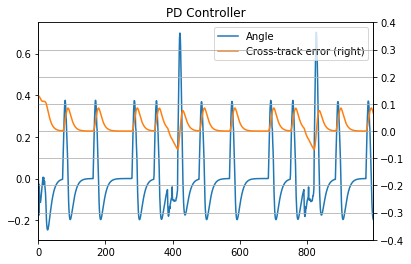

In [4]:
f = plt.figure()
df = pd.DataFrame({'A': [-1.0 * angle for angle in angles], 'B': [-1.0 * dist for dist in distances]})
df.A.plot(label="Angle", legend=True)
df.B.plot(secondary_y=True, label="Cross-track error", legend=True)
plt.title('PD Controller', color='black')
plt.grid()
plt.ylim([-0.4, 0.4])
plt.show()

## Part 2: Pure Pursuit

Within **03-control.txt**, answer the following question:

*While robust, general, and simple, PID controllers also have limitations. What are some failure cases of PID controllers?*
 
In this section, we'll be looking into a type of controller known as a *Pure Pursuit* (PP) controller. A PP controller is not explicitly a reactive controller, but actually requires a reference trajectory that the controller follows. When we input the pose, velocity, and current waypoint, the controller outputs control commands that are used to steer the robot.

Besides robot-specific parameters (which need to be set only once), a PP controller has a single, tunable parameter: *look-ahead* distance. The look-ahead distance is how far along the current path (more on how we do this next section) the robot should _look ahead_ from to compute the angular velocity commands. For simplicity, in our example, the velocity will be fixed.

Before we move on to the code, write the answer to the following in **03-control.txt**:

*Recall the lecture notes about PP controllers. How does the look-ahead distance affect performance? What does a small look-ahead distance prioritize? What about a larger one?*

*** 

As we start the last practical portion of the exercise, we recall a requirement of the PP controller: a reference trajectory. How can we get this from the simulator?

The answer lies inside of the `simulator.py` code, available [here](https://github.com/duckietown/gym-duckietown/blob/master/gym_duckietown/simulator.py). In `gym-duckietown`, we load every tile with a *Bezier* curve, which allows us to calculate a *reward* (useful in reinforcement learning, which we will see later). Each Bezier curve was designed to perfectly fit the right lane of each tile.

`gym-duckietown` provides a few helper functions that we will make use of. Inside of `controller.py:Controller:pure_pursuit`, you will notice a call to `closest_curve_point`, which returns the closest point on the reference trajectory. 

While we have a boilerplate function written, it still needs work. In particular, the main things that need your attention are:

- `follow_point` needs to be a function of a few more items, not just the closest point.
- Once you have the correct waypoint, you need to calculate the $\omega$ that gets you there. You can also change $v$ to go as fast as possible.


In [17]:
from notebooks.code.exercise_03_control.controller import Controller

# Reset environment
local_env = launch_env()
local_env = SteeringToWheelVelWrapper(wrap_env(local_env))
local_env.reset()
local_env.robot_speed = 0.5
controller = Controller()
total_reward = 0
next_ = []
helper = []
angles = []
omegas = []
goals = []
distances = []
velocity = []
for i in range(1000):
    lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
    dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
    angless = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.
    distances.append(dist)
    # Getting the global pose
    pos = local_env.cur_pos
    angle = local_env.cur_angle
    # Control
    v, omega = controller.pure_pursuit(local_env, pos, angle, 0.15, follow_dist=0.02)
    commands = np.array([v, omega])
#     next_.append(nxt)
    angles.append(angless)
    helper.append(pos)
    omegas.append(omega)
    velocity.append(v)
#     goals.append(a)
    # Step
    _, r, d, _ = local_env.step(commands)
    total_reward += r
    
    if d: 
        print("Duckiebot crashed.")
        break
        
local_env.close()

07:09:54|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
07:09:54|gym-duckietown|graphics.py:125|create_frame_buffers(): Falling back to non-multisampled frame buffer
07:09:54|gym-duckietown|simulator.py:535|_load_map(): loading map file "/duckietown/simulation/gym_duckietown/maps/loop_empty.yaml"
07:09:54|gym-duckietown|simulator.py:1092|_drivable_pos(): [4.13719561 0.         1.88880899] corresponds to tile at (7, 3) which is not drivable: {'coords': (7, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2fe97aa518>, 'color': array([1, 1, 1])}
07:09:54|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
07:09:54|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
07:09:54|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [4.0873995 0.        1.9726338]
07:09:54|gym-duckietown|simulator.py:12

07:09:55|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
07:09:55|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
07:09:55|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [3.57292165 0.         1.88314807]
07:09:55|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.48172154 0.         1.84866924]
07:09:55|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [3.66412176 0.         1.91762689]
07:09:55|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.61429624 0.         1.77370793]
07:09:55|gym-duckietown|simulator.py:1092|_drivable_pos(): [3.50690495 0.         2.23654429] corresponds to tile at (5, 3) which is not drivable: {'coords': (5, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2fe97aa518>, 'color': array([1, 1, 1])}
07:09:55|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True

07:09:55|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [3.50609039 0.         2.05544313]
07:09:55|gym-duckietown|simulator.py:1092|_drivable_pos(): [4.12972415 0.         2.27350789] corresponds to tile at (7, 3) which is not drivable: {'coords': (7, 3), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2fe97aa518>, 'color': array([1, 1, 1])}
07:09:55|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
07:09:55|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
07:09:55|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [4.022444   0.         2.32019802]
07:09:55|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [3.98353555 0.         2.23079789]
07:09:55|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [4.06135244 0.         2.40959815]
07:09:55|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [4.12972415 0.         2.27

07:09:58|gym-duckietown|simulator.py:1092|_drivable_pos(): [2.28873639 0.         2.68406941] corresponds to tile at (3, 4) which is not drivable: {'coords': (3, 4), 'kind': 'floor', 'angle': 0, 'drivable': False, 'texture': <simulation.gym_duckietown.graphics.Texture object at 0x7f2fe97aa518>, 'color': array([1, 1, 1])}
07:09:58|gym-duckietown|simulator.py:1202|_valid_pose(): Invalid pose. Collision free: True On drivable area: False
07:09:58|gym-duckietown|simulator.py:1203|_valid_pose(): safety_factor: 1.3
07:09:58|gym-duckietown|simulator.py:1204|_valid_pose(): pos: [2.38071712 0.         2.71640816]
07:09:58|gym-duckietown|simulator.py:1205|_valid_pose(): l_pos: [2.28873639 0.         2.68406941]
07:09:58|gym-duckietown|simulator.py:1206|_valid_pose(): r_pos: [2.47269785 0.         2.74874692]
07:09:58|gym-duckietown|simulator.py:1207|_valid_pose(): f_pos: [2.41952363 0.         2.60603129]
07:09:58|gym-duckietown|simulator.py:516|reset(): Starting at [2.64153703 0.         2.8846

07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.55172839 0.         2.97243537] angle 2.3603035673161537
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.55172839 0.         2.97243537] angle 2.3603035673161537
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54694412 0.         2.96734378] angle 2.2898679576841072
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54694412 0.         2.96734378] angle 2.2898679576841072
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54226502 0.         2.96215375] angle 2.319071251956412
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.54226502 0.         2.96215375] angle 2.319071251956412
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.53743454 0.         2.95710433] angle 2.3490070721190066
07:09:59|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.53743454 0.         2.95710433] angle 2.3490070721190066
07:09:59|gym-duckietown|si

07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.41817382 0.         3.04218513] angle 3.6968708336639793
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.41208808 0.         3.04561571] angle 3.612927344029961
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.41208808 0.         3.04561571] angle 3.612927344029961
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.40581006 0.         3.04868422] angle 3.579504115147181
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.40581006 0.         3.04868422] angle 3.579504115147181
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39935945 0.         3.05136604] angle 3.4916964705437255
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39935945 0.         3.05136604] angle 3.4916964705437255
07:10:00|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.39274536 0.         3.05361991] angle 3.4483418781939026
07:10:00|gym-duckietown|simu

07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.22631698 0.         3.04335661] angle 3.04157296515936
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21936007 0.         3.04269725] angle 3.0526225121935187
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21936007 0.         3.04269725] angle 3.0526225121935187
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21238988 0.         3.04220247] angle 3.088828183502523
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.21238988 0.         3.04220247] angle 3.088828183502523
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.20541145 0.         3.04183455] angle 3.089009637527648
07:10:01|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.20541145 0.         3.04183455] angle 3.089009637527648
07:10:02|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.19843152 0.         3.04149674] angle 3.097457342135257
07:10:02|gym-duckietown|simulat

07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.03096045 0.         3.03270869] angle 3.0866109018304764
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02398266 0.         3.0323289 ] angle 3.08782620399005
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.02398266 0.         3.0323289 ] angle 3.08782620399005
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01700474 0.         3.03195145] angle 3.087279185632804
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01700474 0.         3.03195145] angle 3.087279185632804
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01002605 0.         3.03158878] angle 3.092064328438588
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.01002605 0.         3.03158878] angle 3.092064328438588
07:10:03|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.0030461  0.         3.03125103] angle 3.0944197160525686
07:10:03|gym-duckietown|simulato

07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.83552737 0.         3.0234599 ] angle 3.114665799315563
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82854155 0.         3.02328087] angle 3.1172740513782675
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82854155 0.         3.02328087] angle 3.1172740513782675
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82155553 0.         3.02310946] angle 3.1168504151250938
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.82155553 0.         3.02310946] angle 3.1168504151250938
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.81456941 0.         3.02294234] angle 3.1184998153109897
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.81456941 0.         3.02294234] angle 3.1184998153109897
07:10:04|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.80758288 0.         3.02279346] angle 3.122072068237789
07:10:04|gym-duckietown|si

07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.63987831 0.         3.02283514] angle 3.140847953365517
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.63289024 0.         3.02285573] angle 3.148232141859334
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.63289024 0.         3.02285573] angle 3.148232141859334
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.62590333 0.         3.02297818] angle 3.1699991125463014
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.62590333 0.         3.02297818] angle 3.1699991125463014
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61891769 0.         3.02316431] angle 3.1664641903914834
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.61891769 0.         3.02316431] angle 3.1664641903914834
07:10:05|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.6119324  0.         3.02336258] angle 3.173474080359532
07:10:05|gym-duckietown|simu

07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.44425277 0.         3.02413444] angle 3.126883914037355
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43726553 0.         3.02402376] angle 3.124623191447888
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43726553 0.         3.02402376] angle 3.124623191447888
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43027829 0.         3.023913  ] angle 3.1268625411365276
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.43027829 0.         3.023913  ] angle 3.1268625411365276
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4232909  0.         3.02381166] angle 3.1273195927796005
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.4232909  0.         3.02381166] angle 3.1273195927796005
07:10:06|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.41630354 0.         3.02370859] angle 3.126365420606914
07:10:06|gym-duckietown|simu

07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.24863777 0.         3.01998091] angle 3.116507312276245
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.24165124 0.         3.01983277] angle 3.1242754176387244
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.24165124 0.         3.01983277] angle 3.1242754176387244
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23466416 0.         3.01971178] angle 3.124282315761905
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.23466416 0.         3.01971178] angle 3.124282315761905
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.22767747 0.         3.01957102] angle 3.118615588300633
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.22767747 0.         3.01957102] angle 3.118615588300633
07:10:07|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.22069083 0.         3.01942771] angle 3.1235491571450487
07:10:07|gym-duckietown|simul

07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05992138 0.         2.99113871] angle 2.3034134554191565
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0555355  0.         2.98570264] angle 2.195938790749504
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0555355  0.         2.98570264] angle 2.195938790749504
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05174986 0.         2.97983253] angle 2.0912202387386976
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05174986 0.         2.97983253] angle 2.0912202387386976
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04845003 0.         2.97367366] angle 2.0340994704698967
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04845003 0.         2.97367366] angle 2.0340994704698967
07:10:08|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.04562241 0.         2.96728593] angle 1.9409659319402082
07:10:08|gym-duckietown|si

07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05382168 0.         2.80110746] angle 1.4923190044416828
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05420715 0.         2.79413062] angle 1.5388848583991113
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05420715 0.         2.79413062] angle 1.5388848583991113
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05445871 0.         2.78714704] angle 1.5306954886247488
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05445871 0.         2.78714704] angle 1.5306954886247488
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05467422 0.         2.78016235] angle 1.5492083380195327
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05467422 0.         2.78016235] angle 1.5492083380195327
07:10:09|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.05468293 0.         2.77317471] angle 1.5898922008455483
07:10:09|gym-duckietown|

07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06283553 0.         2.60568785] angle 1.5175480187984203
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06320248 0.         2.59870938] angle 1.5189732338476767
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06320248 0.         2.59870938] angle 1.5189732338476767
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06356555 0.         2.59173069] angle 1.5186620297156732
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06356555 0.         2.59173069] angle 1.5186620297156732
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06391246 0.         2.5847512 ] angle 1.5236046229415958
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06391246 0.         2.5847512 ] angle 1.5236046229415958
07:10:10|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.06423316 0.         2.57777044] angle 1.5261722988851383
07:10:11|gym-duckietown|

07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07033964 0.         2.41017333] angle 1.5459146090091507
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07050747 0.         2.40318723] angle 1.5476397783407725
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07050747 0.         2.40318723] angle 1.5476397783407725
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0706867  0.         2.39620141] angle 1.5426513245384061
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0706867  0.         2.39620141] angle 1.5426513245384061
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07087452 0.         2.38921582] angle 1.5451809498273947
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07087452 0.         2.38921582] angle 1.5451809498273947
07:10:12|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07105147 0.         2.38222994] angle 1.545763019707883
07:10:12|gym-duckietown|s

07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07192708 0.         2.21452411] angle 1.584957429915961
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07172964 0.         2.20753901] angle 1.6131512269398032
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07172964 0.         2.20753901] angle 1.6131512269398032
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07144803 0.         2.20055658] angle 1.6090623613847632
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07144803 0.         2.20055658] angle 1.6090623613847632
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07113823 0.         2.19357537] angle 1.6212250464058917
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07113823 0.         2.19357537] angle 1.6212250464058917
07:10:13|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07081066 0.         2.18659495] angle 1.6141514818614877
07:10:13|gym-duckietown|s

07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07103988 0.         2.01890215] angle 1.557035684860816
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07114316 0.         2.0119148 ] angle 1.5549972760661634
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07114316 0.         2.0119148 ] angle 1.5549972760661634
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07124503 0.         2.00492742] angle 1.55743799331518
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07124503 0.         2.00492742] angle 1.55743799331518
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07133601 0.         1.99793989] angle 1.5581158159084392
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07133601 0.         1.99793989] angle 1.5581158159084392
07:10:14|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07142711 0.         1.99095237] angle 1.5574033884999676
07:10:14|gym-duckietown|simul

07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.0756629  0.         1.82331724] angle 1.5551237942103748
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07576366 0.         1.81632985] angle 1.5576305712468899
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07576366 0.         1.81632985] angle 1.5576305712468899
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07585499 0.         1.80934232] angle 1.5578215158730468
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07585499 0.         1.80934232] angle 1.5578215158730468
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07593752 0.         1.80235469] angle 1.5601496495040166
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07593752 0.         1.80235469] angle 1.5601496495040166
07:10:15|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07599681 0.         1.79536683] angle 1.5644739958313465
07:10:15|gym-duckietown|

07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07419306 0.         1.62766717] angle 1.6003622647359275
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07399099 0.         1.62068197] angle 1.5990709629564648
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07399099 0.         1.62068197] angle 1.5990709629564648
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07378169 0.         1.61369699] angle 1.6024309529050016
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07378169 0.         1.61369699] angle 1.6024309529050016
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07349869 0.         1.60671469] angle 1.6201795754587105
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07349869 0.         1.60671469] angle 1.6201795754587105
07:10:16|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07317713 0.         1.59973399] angle 1.6134772679023965
07:10:16|gym-duckietown|

07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.072326  0.        1.4320373] angle 1.560183225695098
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07239288 0.         1.4250495 ] angle 1.5622667525287894
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07239288 0.         1.4250495 ] angle 1.5622667525287894
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07245116 0.         1.41806162] angle 1.5626458714579132
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07245116 0.         1.41806162] angle 1.5626458714579132
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07251152 0.         1.41107377] angle 1.5616721009158687
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07251152 0.         1.41107377] angle 1.5616721009158687
07:10:17|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07258237 0.         1.40408601] angle 1.5596440161994707
07:10:17|gym-duckietown|simu

07:10:18|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07581918 0.         1.23642027] angle 1.562055967295429
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07587609 0.         1.22943238] angle 1.5632499534316766
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07587609 0.         1.22943238] angle 1.5632499534316766
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07591845 0.         1.22244439] angle 1.5662184900649203
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07591845 0.         1.22244439] angle 1.5662184900649203
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07594736 0.         1.21545633] angle 1.567100670329085
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07594736 0.         1.21545633] angle 1.567100670329085
07:10:19|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.07596215 0.         1.20846823] angle 1.5702595814832019
07:10:19|gym-duckietown|sim

07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.11276028 0.         1.05234204] angle 0.5666572705409891
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.11880109 0.         1.04883262] angle 0.48593370100449573
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.11880109 0.         1.04883262] angle 0.48593370100449573
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12513224 0.         1.04588133] angle 0.38647902760024866
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.12513224 0.         1.04588133] angle 0.38647902760024866
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.13171893 0.         1.04355463] angle 0.29264139878749557
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.13171893 0.         1.04355463] angle 0.29264139878749557
07:10:20|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.13848628 0.         1.04182016] angle 0.20915541846936783
07:10:20|gym-duck

07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.30536366 0.         1.05299955] angle -0.05850986291061109
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.31234221 0.         1.05336435] angle -0.045942956560242554
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.31234221 0.         1.05336435] angle -0.045942956560242554
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.31932729 0.         1.05355659] angle -0.009087843717105006
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.31932729 0.         1.05355659] angle -0.009087843717105006
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32631423 0.         1.05368048] angle -0.026369763775002796
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.32631423 0.         1.05368048] angle -0.026369763775002796
07:10:21|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.3332993  0.         1.05388654] angle -0.03261436054156542
07

07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50074662 0.         1.06328416] angle -0.0536391672426723
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50074662 0.         1.06328416] angle -0.0536391672426723
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50772561 0.         1.06364102] angle -0.04853777331067712
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.50772561 0.         1.06364102] angle -0.04853777331067712
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.51470595 0.         1.06397076] angle -0.04587079179618511
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.51470595 0.         1.06397076] angle -0.04587079179618511
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.52168685 0.         1.06428841] angle -0.04506999001787302
07:10:22|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.52168685 0.         1.06428841] angle -0.04506999001787302
07:10:22|g

07:10:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69621635 0.         1.07179982] angle -0.036808311180273
07:10:23|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.69621635 0.         1.07179982] angle -0.036808311180273
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.70320015 0.         1.07204538] angle -0.03348801022514188
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.70320015 0.         1.07204538] angle -0.03348801022514188
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71018494 0.         1.07226094] angle -0.028214580098509023
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71018494 0.         1.07226094] angle -0.028214580098509023
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71717057 0.         1.0724473 ] angle -0.025127383312144584
07:10:24|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.71717057 0.         1.0724473 ] angle -0.025127383312144584
07:10:24

07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88487527 0.         1.07310457] angle 0.03181691470142739
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.88487527 0.         1.07310457] angle 0.03181691470142739
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.89186006 0.         1.07288895] angle 0.02990479072424062
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.89186006 0.         1.07288895] angle 0.02990479072424062
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.89884412 0.         1.07265151] angle 0.03806239176617547
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.89884412 0.         1.07265151] angle 0.03806239176617547
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.90582363 0.         1.07230765] angle 0.060394034655895296
07:10:25|gym-duckietown|simulator.py:1417|_render_img(): Pos: [1.90582363 0.         1.07230765] angle 0.060394034655895296
07:10:25|gym-d

07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.0735012  0.         1.07125625] angle -0.012580468546173241
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08048866 0.         1.07135187] angle -0.014786777208716899
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08048866 0.         1.07135187] angle -0.014786777208716899
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08747613 0.         1.07144729] angle -0.012521727144039027
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.08747613 0.         1.07144729] angle -0.012521727144039027
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09446372 0.         1.07153296] angle -0.01199835376919764
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.09446372 0.         1.07153296] angle -0.01199835376919764
07:10:26|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.1014513  0.         1.07161978] angle -0.012850585490981545
07

07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26913261 0.         1.07464618] angle -0.014017071756073328
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.26913261 0.         1.07464618] angle -0.014017071756073328
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27612008 0.         1.07474163] angle -0.013304287962704641
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.27612008 0.         1.07474163] angle -0.013304287962704641
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28310731 0.         1.07485282] angle -0.018518665234818217
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.28310731 0.         1.07485282] angle -0.018518665234818217
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29009433 0.         1.07497661] angle -0.01691027731612165
07:10:27|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.29009433 0.         1.07497661] angle -0.01691027731612165
07

07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.45780415 0.         1.07479371] angle 0.002916009007137888
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4647919  0.         1.07472712] angle 0.016141799809745134
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4647919  0.         1.07472712] angle 0.016141799809745134
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47177688 0.         1.07452401] angle 0.04199778880384034
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.47177688 0.         1.07452401] angle 0.04199778880384034
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4787594  0.         1.07424443] angle 0.03804177577970309
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.4787594  0.         1.07424443] angle 0.03804177577970309
07:10:28|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.48574083 0.         1.07393969] angle 0.049202692241489765
07:10:28|gym

07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65339287 0.         1.07187847] angle -0.009918667162307158
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.65339287 0.         1.07187847] angle -0.009918667162307158
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.66038056 0.         1.07195577] angle -0.012206310640476508
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.66038056 0.         1.07195577] angle -0.012206310640476508
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.66736824 0.         1.0720337 ] angle -0.01009649732038316
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.66736824 0.         1.0720337 ] angle -0.01009649732038316
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67435602 0.         1.07210292] angle -0.009716164612754477
07:10:29|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.67435602 0.         1.07210292] angle -0.009716164612754477
07

07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.84202428 0.         1.07523336] angle -0.015065690430775498
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.84901148 0.         1.07534673] angle -0.017380513770818964
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.84901148 0.         1.07534673] angle -0.017380513770818964
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.85599852 0.         1.07546948] angle -0.017754106994695765
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.85599852 0.         1.07546948] angle -0.017754106994695765
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.86298563 0.         1.07558853] angle -0.016316967416320643
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.86298563 0.         1.07558853] angle -0.016316967416320643
07:10:30|gym-duckietown|simulator.py:1417|_render_img(): Pos: [2.86997278 0.         1.07570493] angle -0.01699896070911118
0

07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.03767975 0.         1.07487872] angle 0.004307209352863609
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.03767975 0.         1.07487872] angle 0.004307209352863609
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04466776 0.         1.07483995] angle 0.006787527174200425
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.04466776 0.         1.07483995] angle 0.006787527174200425
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05165501 0.         1.07473487] angle 0.02328746775335455
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05165501 0.         1.07473487] angle 0.02328746775335455
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05864134 0.         1.07457679] angle 0.0219614972678243
07:10:31|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.05864134 0.         1.07457679] angle 0.0219614972678243
07:10:32|gym-d

07:10:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.22633104 0.         1.07295193] angle -0.004584636228569638
07:10:32|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.23331907 0.         1.07298767] angle -0.0056439567375246216
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.23331907 0.         1.07298767] angle -0.0056439567375246216
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.24030703 0.         1.07303508] angle -0.007923812135561722
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.24030703 0.         1.07303508] angle -0.007923812135561722
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.24729498 0.         1.07308353] angle -0.005941977595529634
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.24729498 0.         1.07308353] angle -0.005941977595529634
07:10:33|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.25428298 0.         1.0731241 ] angle -0.00566930924886199

07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42195138 0.         1.07604367] angle -0.020246635075979316
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42195138 0.         1.07604367] angle -0.020246635075979316
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42893842 0.         1.07616636] angle -0.014869143044670009
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.42893842 0.         1.07616636] angle -0.014869143044670009
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.43592585 0.         1.07626403] angle -0.013084633815165721
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.43592585 0.         1.07626403] angle -0.013084633815165721
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.4429135  0.         1.07634488] angle -0.010053856149069543
07:10:34|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.4429135  0.         1.07634488] angle -0.010053856149069543


07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60778513 0.         1.09280453] angle -0.5899995345990315
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61338186 0.         1.09698394] angle -0.6928478750781543
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61338186 0.         1.09698394] angle -0.6928478750781543
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61851112 0.         1.10172507] angle -0.7993432611752738
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61851112 0.         1.10172507] angle -0.7993432611752738
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62315662 0.         1.10694251] angle -0.887299899019979
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62315662 0.         1.10694251] angle -0.887299899019979
07:10:35|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62726592 0.         1.11259044] angle -0.9963058188906193
07:10:35|gym-ducki

07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62939602 0.         1.27726463] angle -1.6740090423113232
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62866049 0.         1.28421393] angle -1.6784816968625305
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62866049 0.         1.28421393] angle -1.6784816968625305
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62796013 0.         1.2911668 ] angle -1.6638948235367594
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62796013 0.         1.2911668 ] angle -1.6638948235367594
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62744735 0.         1.29813563] angle -1.6245959282709606
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62744735 0.         1.29813563] angle -1.6245959282709606
07:10:36|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.62704895 0.         1.30511237] angle -1.6310797234172811
07:10:36|gym-duc

07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.6184186  0.         1.47259174] angle -1.6294108362163051
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61802583 0.         1.47956881] angle -1.6246520039777763
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61802583 0.         1.47956881] angle -1.6246520039777763
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61765722 0.         1.4865472 ] angle -1.6224864508081973
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61765722 0.         1.4865472 ] angle -1.6224864508081973
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61729676 0.         1.49352602] angle -1.622315762648385
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61729676 0.         1.49352602] angle -1.622315762648385
07:10:37|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.61693221 0.         1.50050462] angle -1.6236581781875832
07:10:37|gym-ducki

07:10:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60903618 0.         1.66802291] angle -1.5991420096732087
07:10:38|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60886204 0.         1.67500884] angle -1.592292875365908
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60886204 0.         1.67500884] angle -1.592292875365908
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60872089 0.         1.68199553] angle -1.5897003900980424
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60872089 0.         1.68199553] angle -1.5897003900980424
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60858705 0.         1.68898237] angle -1.590200404453167
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60858705 0.         1.68898237] angle -1.590200404453167
07:10:39|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60841415 0.         1.69596832] angle -1.6008820757942597
07:10:39|gym-duckiet

07:10:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60720344 0.         1.86366749] angle -1.571039562059023
07:10:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60719773 0.         1.87065561] angle -1.572188578669556
07:10:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60719773 0.         1.87065561] angle -1.572188578669556
07:10:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60721902 0.         1.87764367] angle -1.5633094171181128
07:10:40|gym-duckietown|simulator.py:1417|_render_img(): Pos: [3.60721902 0.         1.87764367] angle -1.5633094171181128


In [18]:
print("Your score: {}".format(total_reward))
view_results_ipython(local_env)

Your score: -517.9722399155631


In [64]:
angle

3.43842546373948

To see qualitatively how you are doing:

In [ ]:
lane_pose = local_env.get_lane_pos2(local_env.cur_pos, local_env.cur_angle)
dist = lane_pose.dist        # Distance to lane center. Left is negative, right is positive.
angle_str = lane_pose.angle_rad  # Angle from straight, in radians. Left is negative, right is positive.

In [ ]:
np.linalg.inv(np.array([[np.cos(angle), -np.sin(angle), pos[0]],
                                   [np.sin(angle), np.cos(angle), pos[-1]],
                                   [0, 0, 1]]))

In [ ]:
np.array([[pos[0]], [pos[-1]], [1]])

In [ ]:
curve_point_angle = np.arctan2(*(nxt[::-2] - pos[::-2]))

In [ ]:
curve_point_angle * 180 / np.pi

In [ ]:
(angle - curve_point_angle - 2*np.pi) * 180 / np.pi

In [ ]:
agent_angle = angle + 2.8942716086132663
cos_agent_angle = np.cos(agent_angle + np.pi)
sin_agent_angle = np.sin(agent_angle)
t = np.linalg.inv(np.array([[cos_agent_angle, -sin_agent_angle, pos[0]],
                           [sin_agent_angle, cos_agent_angle, pos[-1]],
                           [0, 0, 1]]))
goal = np.matmul(t, np.array([[nxt[0]], [nxt[-1]], [1]]))

In [ ]:
goal[:-1]

NameError: name 'nxt' is not defined

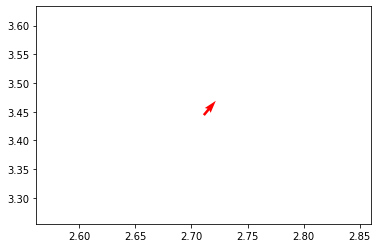

In [84]:
plt.quiver(*pos[::2], -np.cos(angle -2.567804605840248), np.sin(angle -2.567804605840248), color='r')
plt.scatter([nxt[0]], [nxt[-1]])
# plt.quiver(*(pos[::2]), (nxt - pos)[0], (nxt - pos)[-1], angles='xy', scale=2)
plt.xlim([0, 4])
plt.ylim([0, 4])
plt.show()

In [ ]:
np.arctan(a[0][0]/a[0][-1]) *180 / np.pi

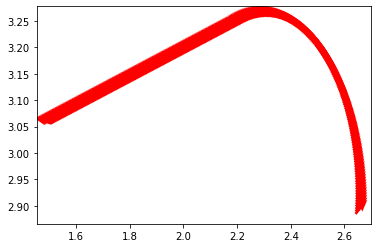

In [89]:
for a, p in zip(angles, helper):
    plt.quiver(*p[::2], -np.cos(a-2.567804605840248), np.sin(a-2.567804605840248), color='r')
# plt.scatter([n[0] for n in next_], [n[-1] for n in next_])
plt.show()

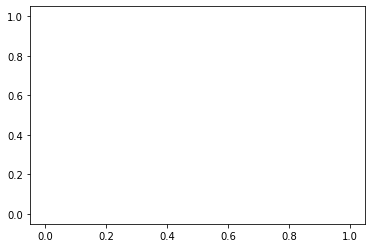

In [49]:
plt.scatter([x[0] for x in goals], [x[1] for x in goals])
plt.show()

In [51]:
p

array([2.71049334, 0.        , 3.43946987])

In [ ]:
plt.plot(omegas)
plt.show()

In [69]:
angle - np.arctan2(*(helper[-1] - helper[280])[::-2])

5.758751696172156

In [83]:
for j ,i in zip(angles, np.diff(helper, axis=1)):
    print(angle - np.arctan2(i[-1], i[0]))

2.5238263425895116
2.5245155569109996
2.525203434822317
2.5258899795576326
2.5265751943436157
2.5272590823994445
2.527941646936806
2.5286228911599022
2.529302818265451
2.5299814314426947
2.530658733873401
2.5313347287318684
2.5320094191849316
2.5326828083919657
2.533354899504891
2.5340256956681793
2.534695200018857
2.535363415686513
2.536030345793303
2.5366959934539555
2.537360361775777
2.538023453858661
2.538685272795089
2.5393458216701417
2.5400051035615037
2.540663121539469
2.5413198786669504
2.541975377999483
2.542629622585234
2.543282615465009
2.543934359672259
2.5445848582330868
2.5452341141662584
2.5458821304832058
2.5465289101880377
2.5471744562775465
2.5478187717412166
2.548461859561233
2.5491037227124873
2.5497443641625903
2.550383786871876
2.5510219937934133
2.5516589878730125
2.5522947720492355
2.5529293492534055
2.553562722409614
2.5541948944347297
2.554825868238411
2.555455646723112
2.556084232784094
2.556711629309432
2.557337839180029
2.5579628652696216
2.558586710444791

In [24]:
2*np.pi - 3.38891369856632

2.8942716086132663

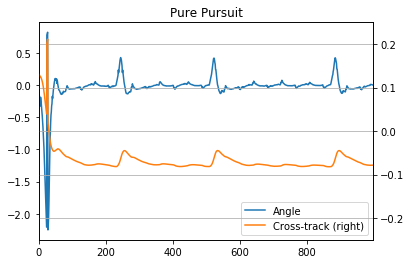

In [20]:
f = plt.figure()
df = pd.DataFrame({'A': [-1.0 * angle for angle in angles], 'B': [-1.0 * dist for dist in distances]})
df.A.plot(label="Angle", legend=True)
df.B.plot(secondary_y=True, label="Cross-track", legend=True)
plt.title('Pure Pursuit', color='black')
plt.grid()
plt.ylim([-0.25, 0.25])
plt.show()

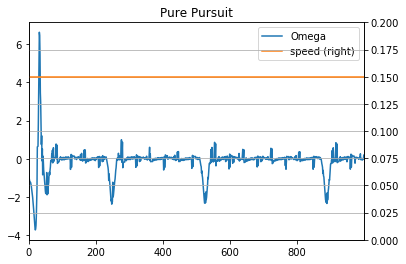

In [21]:
f = plt.figure()
df = pd.DataFrame({'A': [angle for angle in omegas], 'B': [dist for dist in velocity]})
df.A.plot(label="Omega", legend=True)
df.B.plot(secondary_y=True, label="speed", legend=True)
plt.title('Pure Pursuit', color='black')
plt.grid()
plt.ylim([0, 0.2])
plt.show()

For this portion of the exercise, submit one plot with **cross-track error**, **angle error**, **commanded linear velocity** and **commanded angular velocity** vs. time. Lastly, experiment with the `lookup_distance` hyperparameter; does the lowering / raising this value match your hypothesis from earlier in this exercise?

Please submit the plot, `controller.py`, and `control.txt` inside of the zip file, and upload it to the Software submission link posted on Piazza.